# #4 Preprocessing: Visualize your data!

To see how your data behaves, you actually have to take a look at it. To do that we will calculate

- the mean and
- the standard deviation

of the variables at every single gridpoint and

- the spatial correlation and
- the distribution 

of the variables within our dataset.

1) At first, we load our dependencies.

In [14]:
import numpy as np
import datetime as dt
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sb
import xarray as xr

import dask
dask.config.set(scheduler='processes')

from dask.diagnostics import ProgressBar
import link_src
from python.aux.plot import Map

In [58]:
xar = xr.open_mfdataset('../data/usa/monthly_files/*precip*.nc')

Which variables are available in this dataset?

In [59]:
xar.data_vars

Data variables:
    lsp      (time, latitude, longitude) float32 dask.array<shape=(13514, 101, 221), chunksize=(31, 101, 221)>
    cp       (time, latitude, longitude) float32 dask.array<shape=(13514, 101, 221), chunksize=(31, 101, 221)>

## Convenience code to plot spatial maps
For spatial maps we have provided the `Map` class. It basically configures all your plots created with its `.plot()` method thereafter. 
Depending on the location of your data on the globe, you may use a cartopy coordinate reference system (CRS) of your choice. To plot a xarray.DataArray just supply the DataArray as argument to `.plot()`. It returns matplotlib's figure and axis objects.

Some of the most popular CRSs include:
- ccrs.LambertConformal(central_longitude=0, central_latitude=0)
- ccrs.Orthographic(central_longitude=0, central_latitude=0)
- ccrs.PlateCarree()

If you don't want to choose one, it will automatically be chosen for you depending on your geographical domain.

In [19]:
m = Map(figure_kws=dict(figsize=(10,8)))

Now we can plot the mean and the standard deviation for the variable `lsp` - large-scale precipitation.

[########################################] | 100% Completed |  7.0s
[########################################] | 100% Completed |  4.4s


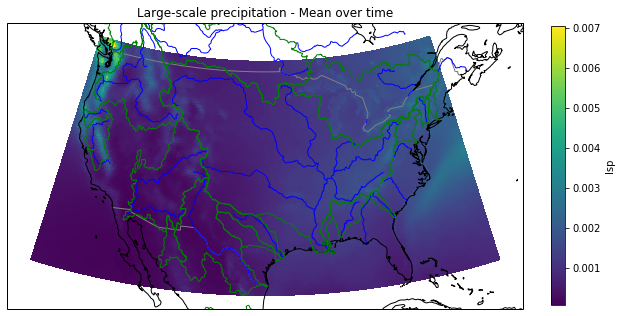

In [20]:
with ProgressBar():
    fig, ax = m.plot(xar['lsp'].mean('time'))
    ax.set_title('Large-scale precipitation - Mean over time')

[########################################] | 100% Completed |  6.4s
[########################################] | 100% Completed |  6.0s


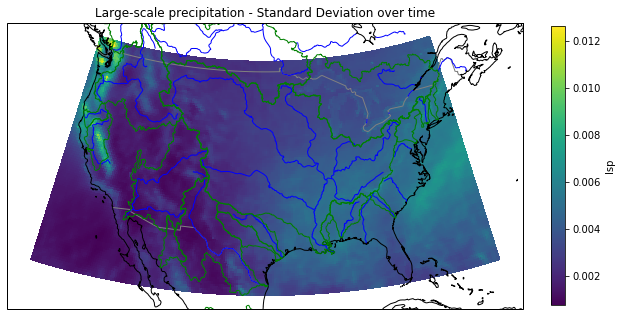

In [21]:
with ProgressBar():
    fig, ax = m.plot(xar['lsp'].std('time'))
    ax.set_title('Large-scale precipitation - Standard Deviation over time')

How does the variable `cp` - convective precipitation?

[########################################] | 100% Completed |  4.5s
[########################################] | 100% Completed |  4.0s


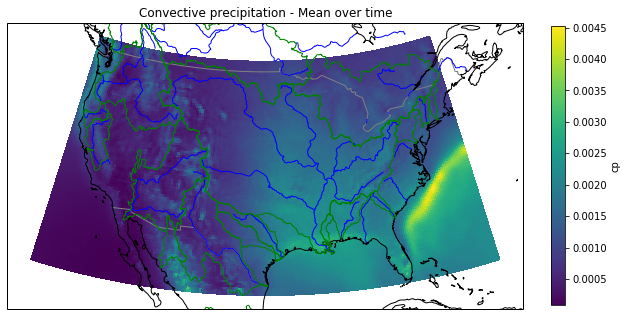

In [22]:
with ProgressBar():
    fig, ax = m.plot(xar['cp'].mean('time'))
    ax.set_title('Convective precipitation - Mean over time')

[########################################] | 100% Completed |  6.5s
[########################################] | 100% Completed |  5.9s


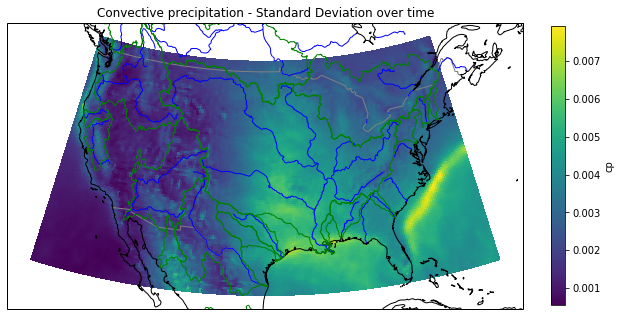

In [23]:
with ProgressBar():
    fig, ax = m.plot(xar['cp'].std('time'))
    ax.set_title('Convective precipitation - Standard Deviation over time')

Here we can already see the effect of the Gulf Stream on convection.

## Spatial correlations

To build a Machine-Learning Model, we typically also want to know how spatially correlated the variables are, because that has an impact on how we configure the dimensionality reduction and the range of influence for predictions.

In [24]:
anom = xar - xar.mean('time')
da = anom['lsp']

Calling `xarray`'s plotting routines without projection yields nice plots too, but they may be distorted if your spatial domain is not of quadratic shape:

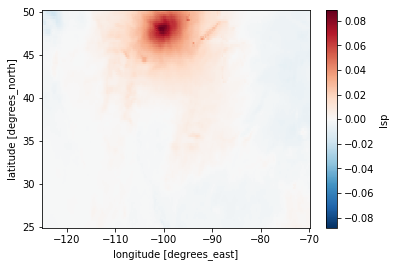

In [25]:
point = dict(latitude=48, longitude=-100)
cov = da.loc[point].dot(da)
cov.plot.pcolormesh()

We now define gridpoints from which we calculate the correlation to all other gridpoints within the domain:

In [28]:
points = [dict(latitude=48, longitude=-100),
          dict(latitude=47, longitude=-80),
          dict(latitude=38, longitude=-115),
         ]

To plot a marker above our selected points, we provide the `plot_point` method. After one plot, call plt.show() to avoid matplotlib showing us only the last one of all plots.

[########################################] | 100% Completed |  7.9s
[########################################] | 100% Completed |  7.7s


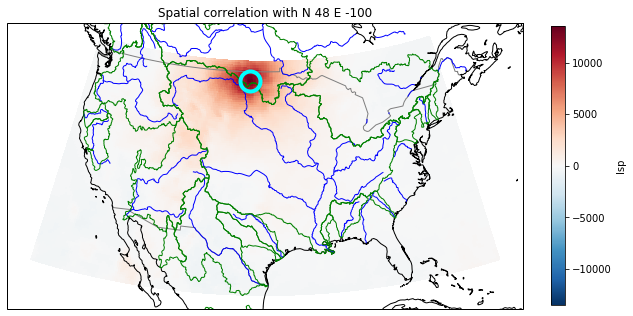

[########################################] | 100% Completed |  9.1s
[########################################] | 100% Completed |  9.8s


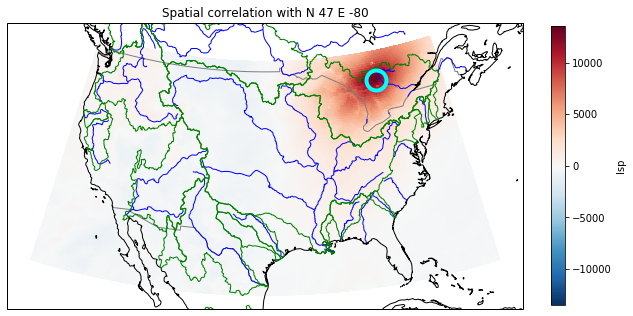

[########################################] | 100% Completed |  9.0s
[########################################] | 100% Completed | 14.7s


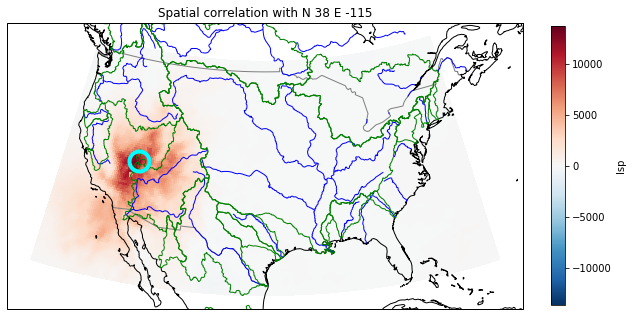

In [31]:
for point in points:
    cov = da.loc[point].dot(da)/da.var('time')
    with ProgressBar():
        fig, ax = m.plot(cov)
        m.plot_point(ax, lat=point['latitude'], lon=point['longitude'])
        ax.set_title(f"Spatial correlation with N {point['latitude']} E {point['longitude']}")
        plt.show()

## Animations: How does a Hurricane look in our data?
To get an even better grasp of the data, animations are quite nice.
Let us define the time frame first. What timeframe could give us most insight into our data? 

We could probably see a hurricane making landfall over the US? What about Hurricane Katrina in August 2005? 
So let's have a look at the months August and September of the Year 2005. If you look closely, you will also see Hurricane Ophelia moving along the east coast on its way over to Europe!

In [45]:
da = (xar['lsp'] + xar['cp']).sel(time=slice(dt.datetime(2005,8,1), 
                                             dt.datetime(2005,10,1)))
da['long_name'] = 'total precipitation'
da['units'] = 'm'

As we wont do heavy computations from now on, we can switch of parallelism and set the dask scheduler to `synchronous`. We can also load the data before rendering the animation.

In [46]:
dask.config.set(scheduler='synchronous')
da = da.load()

To avoid plotting colors where no or very little precipitation occured, let's grey out all values below 0.1 mm/day. As our dataset has precipitation in units of meters (per day), that is 0.001. So we set all values below this threshold to zero.

In [47]:
da = da.where(da>0.001, 0.)

The next cell defines the code to create the animation, this is the place of choice if you want to customize your animation.

In [53]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cartopy
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.io.shapereader import Reader
from cartopy.feature import ShapelyFeature
import xarray as xr

from matplotlib import animation, rc
from IPython.display import HTML

from python.aux.plot import choose_proj_from_xar
from python.aux.ml_flood_config import path_to_data

major_basins_shapefile = path_to_data+'/drainage_basins/Major_Basins_of_the_World.shp'


def create_animation(dataarray):
    da = dataarray
    fig, ax = plt.subplots(figsize=(12,8))
    proj = choose_proj_from_xar(da)
    ax = plt.axes(projection=proj)
    transform = ccrs.PlateCarree()

    countries = cfeature.NaturalEarthFeature(
                            category='cultural',
                            name='admin_0_boundary_lines_land',
                            scale='50m',
                            facecolor='none')
    rivers = cfeature.NaturalEarthFeature(scale='50m', category='physical',
                                          name='rivers_lake_centerlines', 
                                          edgecolor='blue', facecolor='none')

    ax.add_feature(countries, edgecolor='grey')
    ax.coastlines('50m')
    ax.add_feature(rivers, edgecolor='blue')

    sf = Reader(major_basins_shapefile)
    shape_feature = ShapelyFeature(sf.geometries(), transform, edgecolor='black')
    ax.add_feature(shape_feature, facecolor='none', edgecolor='green')

    im = (da.isel(time=0)*np.nan).plot.pcolormesh(ax=ax, transform=transform, 
                                                  subplot_kws=dict(projection=proj),
                                                  cbar_kwargs=dict(fraction=0.025), 
                                                  vmin=0, vmax=.1,
                                                  cmap='ocean_r')
    def init():
        im.set_array(np.array([]))
        return im,

    def animate(i):
        data = da.isel(time=i)
        time = pd.to_datetime(data.time.values)
        title = str(data.long_name.values)+' - '+time.strftime('%Y-%m-%d')
        im.set_array(data.values.ravel())
        ax.set_title(title)
        return (im,)
    
    return animation.FuncAnimation(fig, animate, init_func=init,
                                   frames=len(da.coords['time']), interval=100, 
                                   blit=True)

## Now it's time to render the video
When finished, you have multiple choices:
- Save your video to disk with `anim.save(filename)`
- Show it within this jupyter notebook 
    - as HTML5 Video (mp4) with `HTML(anim.to_html5_video())`
    - as Javascript Animation with `HTML(anim.to_jshtml())`
    
Note that github.com does not show your animations currently, but https://nbviewer.jupyter.org is an excellent site with lets you view all contents.

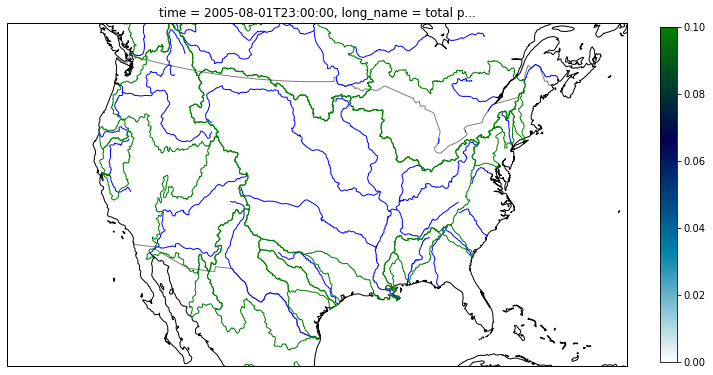

In [54]:
anim = create_animation(da)

In [55]:
HTML(anim.to_html5_video())

In [56]:
anim.save('tp_2005_August+September.mp4')

In [57]:
HTML(anim.to_jshtml())